## Static maps

### Static maps in geopandas
We have already plotted basic static maps using geopandas during the previous weeks of this course. Remember that when using the plot() method in geopandas, we are actually using the tools available from matplotlib pyplot.

Let’s refresh our memory about the basics of plotting maps by creating a static accessibility map with roads and metro line on it (three layers on top of each other in the same figure). Before plotting the layers, we need to check that they are in the same coordinate reference system.

As usual, we start by importing the useful modules and reading in the input files:



In [1]:
import geopandas as gpd
from pyproj import CRS
import matplotlib.pyplot as plt

# Filepaths
grid_fp = "data/TravelTimes_to_5975375_RailwayStation.shp"
roads_fp = "data/roads.shp"
metro_fp = "data/metro.shp"

# Read files
grid = gpd.read_file(grid_fp)
roads = gpd.read_file(roads_fp)
metro = gpd.read_file(metro_fp)

# Check the crs of each layer
print(roads.crs)
print(metro.crs)
print(grid.crs)

epsg:2392
epsg:2392
epsg:3067


In [2]:
# Check CRS names
print(f"Roads crs: {CRS(roads.crs).name}")
print(f"Metro crs: {CRS(metro.crs).name}")
print(f"Grid crs: {CRS(grid.crs).name}")

Roads crs: KKJ / Finland zone 2
Metro crs: KKJ / Finland zone 2
Grid crs: ETRS89 / TM35FIN(E,N)


In [3]:
# Reproject geometries to ETRS89 / TM35FIN based on the grid crs:
roads = roads.to_crs(crs=grid.crs)
metro = metro.to_crs(crs=grid.crs)

In [4]:
roads.crs == metro.crs == grid.crs

True

**Plotting options for the polygon:**

- Define the classification scheme using the scheme parameter

- Change the colormap using the cmap parameter. See colormap options from matplotlib documentation.

- You can add a little bit of transparency for the grid using the alpha parameter (ranges from 0 to 1 where 0 is fully transparent)

**Plotting options fo the lines:**

- adjust color using color parameter. See color options from matplotlib pyplot documentation.

- change linewidth if needed

For better control of the figure and axes, use the plt.subplots function before plotting the layers. See more info in matplotlib documentation.

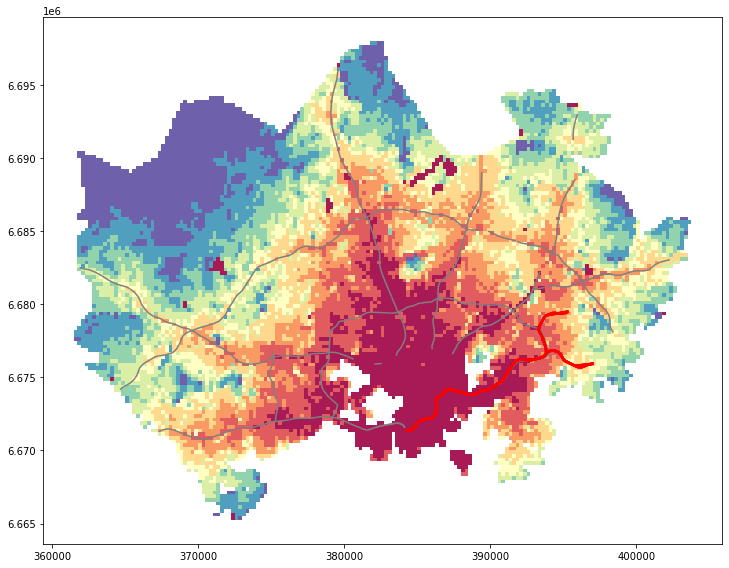

In [5]:
# Create one subplot. Control figure size in here.
fig, ax = plt.subplots(figsize=(12,8))

# Visualize the travel times into 9 classes using "Quantiles" classification scheme
grid.plot(ax=ax, column="car_r_t", linewidth=0.03, cmap="Spectral", scheme="quantiles", k=9, alpha=0.9)

# Add roads on top of the grid
# (use ax parameter to define the map on top of which the second items are plotted)
roads.plot(ax=ax, color="grey", linewidth=1.5)

# Add metro on top of the previous map
metro.plot(ax=ax, color="red", linewidth=2.5)

# Remove the empty white-space around the axes
plt.tight_layout()

# Save the figure as png file with resolution of 300 dpi
outfp = "static_map.png"
plt.savefig(outfp, dpi=300)

### Adding a legend
It is possible to enable legend for a geopandas plot by setting legend=True in the plotting parameters. If plotting the figure without a classification scheme you get a color bar as the legend item and it is easy to add a label for the legend using legend_kwds. You can read more about creating a legend via geopandas in here.

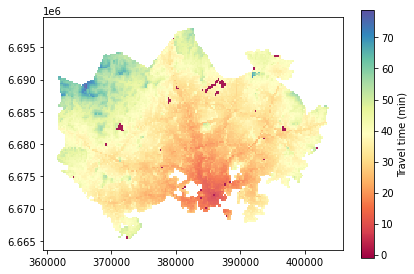

In [6]:
# Create one subplot. Control figure size in here.
fig, ax = plt.subplots(figsize=(6,4))

# Visualize the travel times into 9 classes using "Quantiles" classification scheme
grid.plot(ax=ax, column="car_r_t", 
          linewidth=0.03, 
          cmap="Spectral", 
          alpha=0.9, 
          legend=True, 
          legend_kwds={'label': "Travel time (min)"}
         )

#ax.get_legend().set_bbox_to_anchor(8)
#ax.get_legend().set_title("Legend title")

# Remove the empty white-space around the axes
plt.tight_layout()

If plotting a map using a classification scheme, we get a different kind of legend that shows the class values. In this case, we can control the position and title of the legend using matplotlib tools. We first need to access the Legend object and then change it’s properties.

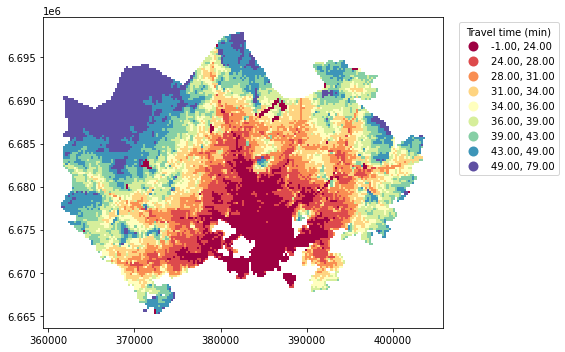

In [7]:
# Create one subplot. Control figure size in here.
fig, ax = plt.subplots(figsize=(10,5))

# Visualize the travel times into 9 classes using "Quantiles" classification scheme
grid.plot(ax=ax, 
          column="car_r_t", 
          linewidth=0.03, 
          cmap="Spectral", 
          scheme="quantiles", 
          k=9, 
          legend=True, 
          )

# Re-position the legend and set a title
ax.get_legend().set_bbox_to_anchor((1.3,1))
ax.get_legend().set_title("Travel time (min)")

# Remove the empty white-space around the axes
plt.tight_layout()

### Adding basemap from external source
It is often useful to add a basemap to your visualization that shows e.g. streets, placenames and other contextual information. This can be done easily by using ready-made background map tiles from different providers such as OpenStreetMap or Stamen Design. A Python library called contextily is a handy package that can be used to fetch geospatial raster files and add them to your maps. Map tiles are typically distributed in Web Mercator projection (EPSG:3857), hence it is often necessary to reproject all the spatial data into Web Mercator before visualizing the data.

In this tutorial, we will see how to add a basemap underneath our previous visualization.

- Read in the travel time data:

In [8]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
%matplotlib inline

# Filepaths
grid_fp = "data/TravelTimes_to_5975375_RailwayStation.shp"

# Read data
grid = gpd.read_file(grid_fp)
grid.head(3)

,car_m_d,car_m_t,car_r_d,car_r_t,from_id,pt_m_d,pt_m_t,pt_m_tt,pt_r_d,pt_r_t,pt_r_tt,to_id,walk_d,walk_t,geometry
0,32297,43,32260,48,5785640,32616,116,147,32616,108,139,5975375,32164,459,"POLYGON ((382000.000 6697750.000, 381750.000 6..."
1,32508,43,32471,49,5785641,32822,119,145,32822,111,133,5975375,29547,422,"POLYGON ((382250.000 6697750.000, 382000.000 6..."
2,30133,50,31872,56,5785642,32940,121,146,32940,113,133,5975375,29626,423,"POLYGON ((382500.000 6697750.000, 382250.000 6..."


In [9]:
print(grid.crs)

epsg:3067


In [10]:
# Reproject to EPSG 3857
data = grid.to_crs(epsg=3857)
print(data.crs)

epsg:3857


In [11]:
data.head(2)

,car_m_d,car_m_t,car_r_d,car_r_t,from_id,pt_m_d,pt_m_t,pt_m_tt,pt_r_d,pt_r_t,pt_r_tt,to_id,walk_d,walk_t,geometry
0,32297,43,32260,48,5785640,32616,116,147,32616,108,139,5975375,32164,459,"POLYGON ((2767221.646 8489079.101, 2766716.966..."
1,32508,43,32471,49,5785641,32822,119,145,32822,111,133,5975375,29547,422,"POLYGON ((2767726.329 8489095.521, 2767221.646..."


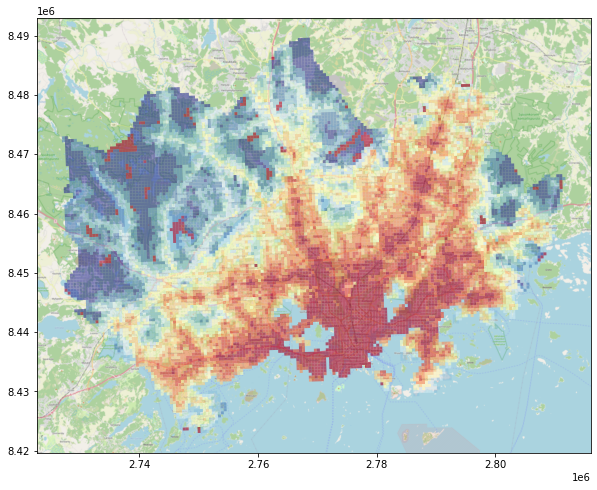

In [44]:
import folium

# Control figure size in here
fig, ax = plt.subplots(figsize=(12,8))

# Plot the data
data.plot(ax=ax, column='pt_r_t', cmap='RdYlBu', linewidth=0, scheme="quantiles", k=9, alpha=0.6)

# Add basemap 
ctx.add_basemap(ax, source='https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png')

(8435000.0, 8442500.0)

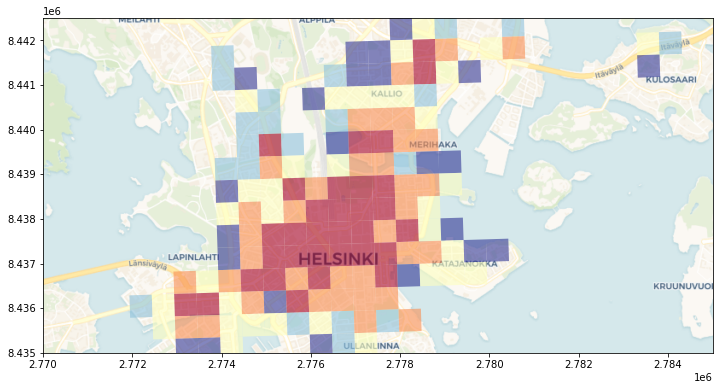

In [42]:
# Control figure size in here
fig, ax = plt.subplots(figsize=(12,8))

# The formatting should follow: 'https://{s}.basemaps.cartocdn.com/{style}/{z}/{x}/{y}{r}.png'
# Specify the style to use
style = "dark_all"
cartodb_url = 'https://a.basemaps.cartocdn.com/%s/{z}/{x}/{y}.png' % style
# Subset the data to seel only grid squares near the destination
subset = data.loc[(data['pt_r_t']>=0) & (data['pt_r_t']<=15)]
# Plot the data from subset
subset.plot(ax=ax, column='pt_r_t', cmap='RdYlBu', linewidth=0, scheme="quantiles", k=5, alpha=0.6)

# Add basemap with `OSM_A` style using zoom level of 14 
ctx.add_basemap(ax, zoom=13, attribution="", source='https://a.basemaps.cartocdn.com/rastertiles/voyager/{z}/{x}/{y}.png')

# Crop the figure
ax.set_xlim(2770000, 2785000)
ax.set_ylim(8435000, 8442500)

## Interactive maps
In this tutorial we will learn how to publish data from Python on interactive leaflet.js maps.

JavaScript (JS) is a programming language for adding interactive content (such a zoomamble maps!) on webpages. Leaflet is a popular JavaScript library for creating interactive maps for webpages (OpenLayers is another JavaScript library for the same purpose).

Here, will mainly focus on Folium - a Python library that makes it easy to convert data from (Geo)DataFrames into interactive Leaflet maps.

### Folium
Folium is a Python library that makes it possible visualize data on an interactive Leaflet map.

**Resources:**

- Folium Documentation

- Example Gallery

- Folium Quickstart

### Creating a simple interactive web-map
Import folium and other useful packages:

In [45]:
import folium
from pyproj import crs
import geopandas as gpd
import matplotlib.pyplot as plt

We will start by creating a simple interactive web-map without any data on it. We just visualize OpenStreetMap on a specific location of the world.

First thing that we need to do is to create a Map instance and define a location for zooming in the data.

The first parameter location takes a pair of lat, lon values as list as an input which will determine where the map will be positioned when user opens up the map. zoom_start -parameter adjusts the default zoom-level for the map (the higher the number the closer the zoom is). control_scale defines if map should have a scalebar or not.

In [46]:
# Create a Map instance
m = folium.Map(location=[60.25, 24.8], zoom_start=10, control_scale=True)

In [47]:
m

In [48]:
outfp = "base_map.html"
m.save(outfp)

You should now see a html file in your working directory. You can open the file in a web-browser in order to see the map, or in a text editor in order to see the source definition.

Let’s create another map with different settings (location, bacground map, zoom levels etc). See documentation of the Map() object for all avaiable options.

tiles -parameter is used for changing the background map provider and map style (see the documentation for all in-built options).
### Adding layers to the map
Let’s first have a look how we can add a simple marker on the webmap:

In [51]:
# Create a Map instance
m = folium.Map(location=[60.20, 24.96],
    zoom_start=12, control_scale=True)

# Add marker
# Run: help(folium.Icon) for more info about icons
folium.Marker(
    location=[60.20426, 24.96179],
    popup='Kumpula Campus',
    icon=folium.Icon(color='green', icon='ok-sign'),
).add_to(m)

#Show map
m

As mentioned, Folium combines the strenghts of data manipulation in Python with the mapping capabilities of Leaflet.js. Eventually, we would like to include the plotting of interactive maps as the last part of our data analysis workflow.

Let’s see how we can plot data from a geodataframe using folium.

In [52]:
# File path
points_fp = r"data/addresses.shp"

# Read the data
points = gpd.read_file(points_fp)

#Check input data
points.head()

,address,id,geometry
0,"Kampinkuja 1, 00100 Helsinki, Finland",1001,POINT (24.93017 60.16837)
1,"Kaivokatu 8, 00101 Helsinki, Finland",1002,POINT (24.94189 60.16987)
2,"Hermanstads strandsväg 1, 00580 Helsingfors, F...",1003,POINT (24.97740 60.18736)
3,"Itäväylä, 00900 Helsinki, Finland",1004,POINT (25.09196 60.21448)
4,"Tyynenmerenkatu 9, 00220 Helsinki, Finland",1005,POINT (24.92148 60.15658)


In [53]:
# Convert points to GeoJSON
points_gjson = folium.features.GeoJson(points, name="Public transport stations")

In [58]:
# points_gjson.data.get('features')

Now we have our population data stored as GeoJSON format which basically contains the data as text in a similar way that it would be written in the .geojson -file.

Add the points onto the Helsinki basemap:

In [60]:
# Create a Map instance
m = folium.Map(location=[60.25, 24.8], zoom_start=11, control_scale=True)

# Add points to the map instance
points_gjson.add_to(m)

# Alternative syntax for adding points to the map instance
#m.add_child(points_gjson)

# We can also add a LayerControl object on our map, which allows the user to control which map layers are visible. See the documentation for available parameters (you can e.g. change the position of the layer control icon).

# Create a layer control object and add it to our map instance
folium.LayerControl().add_to(m)

#Show map
m

## Heatmap
Folium plugins allow us to use popular tools available in leaflet. One of these plugins is HeatMap, which creates a heatmap layer from input points.

Let’s visualize a heatmap of the public transport stations in Helsinki using the addresses input data. folium.plugins.HeatMap requires a list of points, or a numpy array as input, so we need to first manipulate the data a bit:

In [61]:
# Get x and y coordinates for each point
points["x"] = points["geometry"].x
points["y"] = points["geometry"].y

# Create a list of coordinate pairs
locations = list(zip(points["y"], points["x"]))

In [68]:
from folium.plugins import HeatMap

# Create a Map instance
m = folium.Map(location=[60.25, 24.8], zoom_start=11, control_scale=True)

# Add heatmap to map instance
# Available parameters: HeatMap(data, name=None, min_opacity=0.5, max_zoom=18, max_val=1.0, radius=25, blur=15, gradient=None, overlay=True, control=True, show=True)
HeatMap(locations).add_to(m)

# Show map
m

### Clustered point map
Let’s visualize the address points (locations of transport stations in Helsinki) on top of the choropleth map using clustered markers using folium’s MarkerCluster class.

In [70]:
from folium.plugins import MarkerCluster

# Create a Map instance
m = folium.Map(location=[60.25, 24.8], zoom_start=11, control_scale=True)

# Following this example: https://github.com/python-visualization/folium/blob/master/examples/MarkerCluster.ipynb
# Get x and y coordinates for each point
points["x"] = points["geometry"].x
points["y"] = points["geometry"].y

# Create a list of coordinate pairs
locations = list(zip(points["y"], points["x"]))

In [71]:
# Create a folium marker cluster
marker_cluster = MarkerCluster(locations)

# Add marker cluster to map
marker_cluster.add_to(m)

# Show map
m

### Choropleth map
Next, let’s check how we can overlay a population map on top of a basemap using folium’s choropleth method. This method is able to read the geometries and attributes directly from a geodataframe. This example is modified from the Folium quicksart.

- First read in the population grid from HSY wfs like we did in lesson 3:

In [72]:
import geopandas as gpd
from pyproj import CRS
import requests
import geojson

# Specify the url for web feature service
url = 'https://kartta.hsy.fi/geoserver/wfs'

# Specify parameters (read data in json format).
# Available feature types in this particular data source: http://geo.stat.fi/geoserver/vaestoruutu/wfs?service=wfs&version=2.0.0&request=describeFeatureType
params = dict(service='WFS',
              version='2.0.0',
              request='GetFeature',
              typeName='asuminen_ja_maankaytto:Vaestotietoruudukko_2020',
              outputFormat='json')

# Fetch data from WFS using requests
r = requests.get(url, params=params)

# Create GeoDataFrame from geojson
data = gpd.GeoDataFrame.from_features(geojson.loads(r.content))
# Clean overall cell
data = data[data['index'] != 27699]
# Check the data
data.head()

,geometry,index,asukkaita,asvaljyys,ika0_9,ika10_19,ika20_29,ika30_39,ika40_49,ika50_59,ika60_69,ika70_79,ika_yli80
0,"POLYGON ((25472499.995 6685998.998, 25472499.9...",703,5,51,99,99,99,99,99,99,99,99,99
1,"POLYGON ((25472499.995 6684249.004, 25472499.9...",710,8,44,99,99,99,99,99,99,99,99,99
2,"POLYGON ((25472499.995 6683999.005, 25472499.9...",711,5,90,99,99,99,99,99,99,99,99,99
3,"POLYGON ((25472499.995 6682998.998, 25472499.9...",715,13,34,99,99,99,99,99,99,99,99,99
4,"POLYGON ((25472749.993 6690249.003, 25472749.9...",848,5,53,99,99,99,99,99,99,99,99,99


In [73]:
from pyproj import CRS
# Define crs
data.crs = CRS.from_epsg(3879)

In [74]:
# Re-project to WGS84
data = data.to_crs(epsg=4326)

# Check layer crs definition
print(data.crs)

epsg:4326


In [75]:
# Change the name of a column
data = data.rename(columns={'asukkaita': 'pop20'})

In [76]:
# Create a Geo-id which is needed by the Folium (it needs to have a unique identifier for each row)
data['geoid'] = data.index.astype(str)

In [77]:
# Select only needed columns
data = data[['geoid', 'pop20', 'geometry']]

# Convert to geojson (not needed for the simple coropleth map!)
#pop_json = data.to_json()

#check data
data.head()

,geoid,pop20,geometry
0,0,5,"POLYGON ((24.50287 60.28562, 24.50284 60.28787..."
1,1,8,"POLYGON ((24.50311 60.26992, 24.50308 60.27216..."
2,2,5,"POLYGON ((24.50315 60.26767, 24.50311 60.26992..."
3,3,13,"POLYGON ((24.50328 60.25870, 24.50325 60.26094..."
4,4,5,"POLYGON ((24.50682 60.32378, 24.50678 60.32603..."


In [83]:
# Create a Map instance
m = folium.Map(location=[60.25, 24.8], zoom_start=11, control_scale=True)

# Plot a choropleth map
# Notice: 'geoid' column that we created earlier needs to be assigned always as the first column
folium.Choropleth(
    geo_data=data,
    name='Population in 2020',
    data=data,
    columns=['geoid', 'pop20'],
    key_on='feature.id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    line_color='white', 
    line_weight=0,
    highlight=False, 
    smooth_factor=1.0,
    #threshold_scale=[100, 250, 500, 1000, 2000],
    legend_name= 'Population in Helsinki').add_to(m)

#Show map
m

### Tooltips
It is possible to add different kinds of pop-up messages and tooltips to the map. Here, it would be nice to see the population of each grid cell when you hover the mouse over the map. Unfortunately this functionality is not apparently implemented implemented in the Choropleth method we used before.

Add tooltips, we can add tooltips to our map when plotting the polygons as GeoJson objects using the GeoJsonTooltip feature. (following examples from here and here)

For a quick workaround, we plot the polygons on top of the coropleth map as a transparent layer, and add the tooltip to these objects. Note: this is not an optimal solution as now the polygon geometry get’s stored twice in the output!

In [84]:
# Convert points to GeoJson
folium.features.GeoJson(data,  
                        name='Labels',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        tooltip=folium.features.GeoJsonTooltip(fields=['pop20'],
                                                                aliases = ['Population'],
                                                                labels=True,
                                                                sticky=False
                                                                            )
                       ).add_to(m)

m

In [85]:
outfp = "choropleth_map.html"
m.save(outfp)